# Введение в анализ данных
## Домашнее задание 2. `Pandas` и `Seaborn`


**Правила:**

* Дедлайн **30 апреля 23:59**. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Выполненную работу нужно отправить на почту `mipt.stats@yandex.ru`, указав тему письма `"[номер группы] Фамилия Имя - Задание 2"`. Квадратные скобки обязательны.
* Прислать нужно ноутбук и его pdf-версию (без архивов). Названия файлов должны быть такими: `2.N.ipynb` и `2.N.pdf`, где `N` -- ваш номер из таблицы с оценками. *pdf-версию можно сделать с помощью Ctrl+P. Пожалуйста, посмотрите ее полностью перед отправкой. Если что-то существенное не напечатается в pdf, то баллы могут быть снижены.*
* Решения, размещенные на каких-либо интернет-ресурсах, не принимаются. Кроме того, публикация решения в открытом доступе может быть приравнена к предоставлении возможности списать.
* Для выполнения задания используйте этот ноутбук в качестве основы, ничего не удаляя из него.
* Если код будет не понятен проверяющему, оценка может быть снижена.
* Никакой код при проверке запускаться не будет.

**Баллы за задание:**

Легкая часть (достаточно на "хор"):

* Задача 1 -- 4 балла
* Задача 2 -- 2 балла

Сложная часть (необходимо на "отл"):

* Задача 3 -- 5 баллов
* Задача 4 -- 3 балла
* Задача 5 -- 8 баллов

Баллы за разные части суммируются отдельно, нормируются впоследствии также отдельно. Иначе говоря, 1 балл за легкую часть может быть не равен 1 баллу за сложную часть.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

px.set_mapbox_access_token(open('data/.mapbox_token').read())
sns.set(style='whitegrid', font_scale=1.3)
%matplotlib inline

## Легкая часть

### Задача 1

Представьте, что вы министр образования страны котиков. Вам нужно решить какие школы лучше: маленькие или большие.

Вы решили, что нужно сравнить их по результатам единого кошачьего экзамена (ЕКЭ). Предлагается посмотреть на средний результат по школам: отсортировать по нему и сделать выводы исходя из топ 10 лучших школ.

Вам дан датасет `cat_exam_data.csv`

Описание данных:

* `school` -- номер школы;
* `test_score` -- результат одного ученика из этой школы;
* `number_of_students` -- кол-во учеников в школе.

Приведены данные по всем ученикам из 500 школ страны котиков.

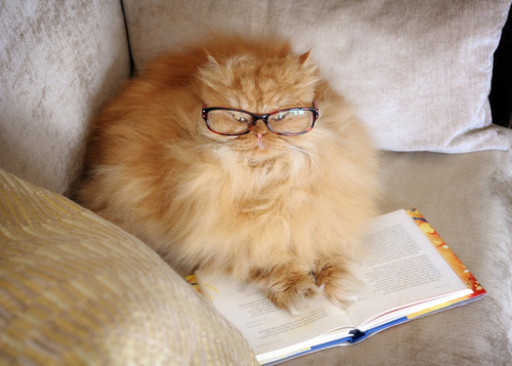

Загрузите датасет с результатами экзамена и посмотрите на первые пять строк.

Это можно сделать с помощью методов  <a href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.read_csv.html">read_csv</a> и <a href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.head.html">head</a>.

In [2]:
cats_results = pd.read_csv('data/cat_exam_data.csv')

In [3]:
cats_results.head(5)

,school,test_score,number_of_students
0,26,39.0,965
1,54,64.0,1483
2,356,64.0,1055
3,108,68.0,1806
4,298,78.0,971


Проверьте, что в данных нет пропусков (`NaN`). Если они есть:
* проверьте в каком столбце;
* удалите их.

Могут помочь методы <a href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.isna.html">isna</a> и <a href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.dropna.html">dropna</a>.

In [4]:
cats_results.isna().tail(10)

,school,test_score,number_of_students
501552,False,False,False
501553,False,False,False
501554,False,False,False
501555,False,False,False
501556,False,False,False
501557,False,False,False
501558,False,False,False
501559,False,False,False
501560,False,False,False
501561,False,False,False


In [5]:
cats_results.isna().sum()

school                  0
test_score            204
number_of_students      0
dtype: int64

Пропусков данных не так много, всего 0.04%, можно и просто выкинуть.

In [6]:
cats_results = cats_results.dropna()

Посчитайте описательные статистики (среднее, мин, макс, и тд.) по колонкам в таблице с помощью одной функции:

In [7]:
cats_results.describe()

,school,test_score,number_of_students
count,501358.000000,501358.000000,501358.000000
mean,250.096795,51.681788,1088.910569
std,144.428420,14.179981,281.016801
min,0.000000,0.000000,156.000000
25%,125.000000,42.000000,890.000000
50%,250.000000,52.000000,1079.000000
75%,377.000000,61.000000,1285.000000
max,499.000000,100.000000,1806.000000


Посчитайте сколько котиков получили 100 баллов:

In [8]:
perfect_results = cats_results[cats_results['test_score'] == 100.0]
len(perfect_results)

51

Выведите информацию о школах, где есть хотя бы один котик, получивший 100 баллов на ЕКЭ.

Отсортируйте эти школы по количеству стобалльников.

Могут помочь методы <a href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.groupby.html">groupby</a>, <a href="https://pandas.pydata.org/pandas-docs/version/0.23.4/generated/pandas.DataFrame.sort_values.html">sort_values</a>, <a href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.transform.html">transform</a> и <a href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.count.html">count</a>.

In [9]:
perf_schools = perfect_results[['school', 'number_of_students']]\
    .groupby('school').aggregate([np.mean, np.size])
perf_schools.columns = ['number_of_students', 'num_perfect_results']
perf_schools

,number_of_students,num_perfect_results
school,,
4,1015,1
14,777,1
18,715,1
42,650,1
69,1012,1
82,555,1
90,1244,1
91,749,1
96,943,1


Посчитайте средний результат каждой из школ и посмотрите на результат:

Может помочь метод <a href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.mean.html">mean</a>.

In [10]:
school_means = cats_results.groupby('school').mean()
school_means.head(10)

,test_score,number_of_students
school,,
0,52.294258,418
1,52.028950,1209
2,51.751451,1035
3,51.566265,1245
4,51.025641,1015
5,51.394737,988
6,52.063527,914
7,51.670356,1265
8,51.543436,1036


Отсортируйте школы по среднему результату:

In [11]:
school_means = school_means.sort_values('test_score', ascending=False)

Посмотрите на топ 10 лучших результатов:

In [12]:
school_means.head(10)

,test_score,number_of_students
school,,
57,53.341682,560
124,52.993311,598
263,52.982063,669
82,52.981982,555
366,52.970207,773
465,52.957555,1179
169,52.932401,858
449,52.910364,357
477,52.898515,808


**Вывод:** в каждой из школ средний балл не сильно превышает половину максимального, то есть в целом экзамены пишутся достаточно плохо.

Ожидаем, что внизу рейтинга будут только большие школы, давайте это проверим.

Посмотрите теперь на 10 худших школ:

In [13]:
school_means.tail(10)

,test_score,number_of_students
school,,
383,50.716981,636
264,50.702906,929
48,50.690293,649
156,50.641354,1093
394,50.461538,1079
194,50.406977,774
471,50.362500,960
486,50.325000,800
211,50.248571,351


**Вывод:** внизу рейтинга находятся как большие, так и маленькие школы.

Постройте график зависимости среднего результата ЕКЭ от количества учеников:

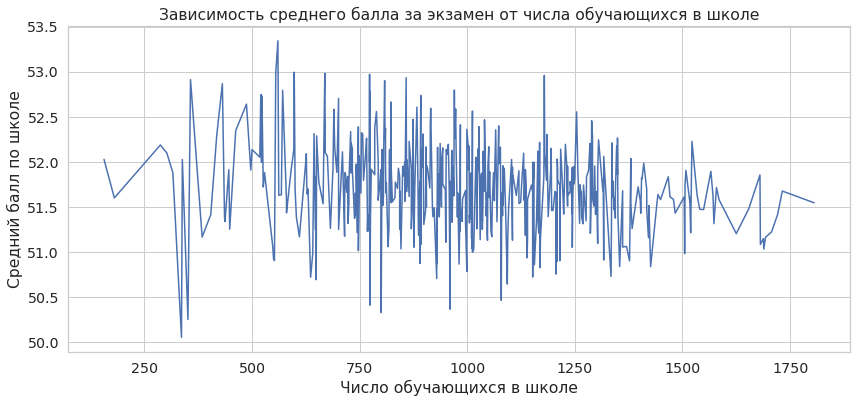

In [14]:
plt.figure(figsize=(14,6))
plt.title('Зависимость среднего балла за экзамен от числа обучающихся в школе')
plt.xlabel('Число обучающихся в школе')
plt.ylabel('Средний балл по школе')
plt.plot(
    school_means.sort_values('number_of_students').number_of_students,
    school_means.sort_values('number_of_students').test_score
)
plt.show()

**Вывод:** средний балл не зависит от размера школы, так как график больше напоминает какой-то шум

Но как же тогда решить какие школы лучше? 

Сгруппируйте учеников в зависимости от типа школы (<= 1000 учеников == маленькая школа):

In [15]:
cats_groups = [
    (cats_results[cats_results['number_of_students'] <= 1000],
     r"$\leq 1000$ учеников"
    ),
    (cats_results[cats_results['number_of_students'] > 1000],
     r"$> 1000$ учеников"
    )
]

Постройте гистограммы этих двух выборок на одном графике, установив параметры
* `bins=10` --- число бинов гистограммы;
* `alpha=0.5` --- прозрачность бинов.

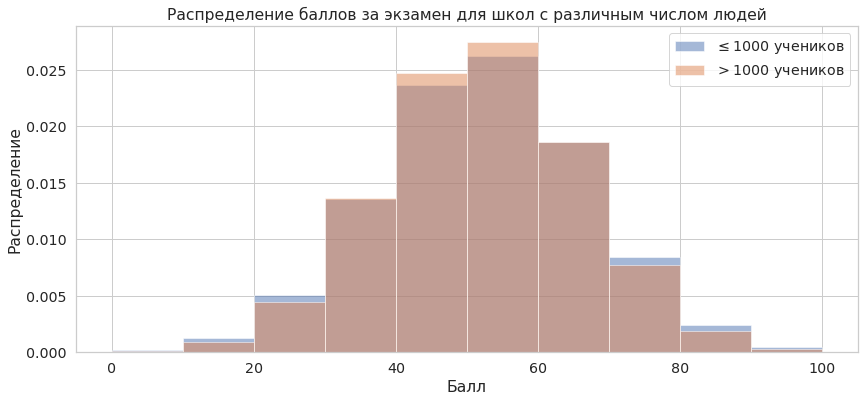

In [16]:
plt.figure(figsize=(14,6))
for group, label in cats_groups:
    plt.hist(
        group.test_score,
        bins=10,
        density=True,
        alpha=0.5,
        label=label
    )
plt.title('Распределение баллов за экзамен для школ с различным числом людей')
plt.xlabel('Балл')
plt.ylabel('Распределение')
plt.legend(loc='best')
plt.show()

**Вывод:** в маленьких школах низкие (ниже 30) и высокие (выше 70) баллы получает большая доля людей, чем в крупных. Лучше это или хуже - вопрос спорный. Мне кажется, что поскольку целью школьного образования является получение базовых знаний, то важнее выполнение задачи дать знания на среднем уровне, а с этой задачей лучше справляются крупные школы.

---

### Задача 2

Задача заключается в работе с данными о трендах на YouTube. В этом вам поможет библиотека `seaborn`, которая была рассмотрена на одной из последних лекций.

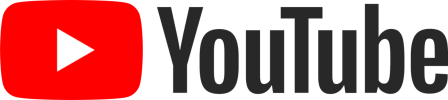


<b>1. Подготовка данных</b>

Скачайте файл `RUvideos_short.csv` с данными о видео в российском сегменте Youtube с 14 ноября по 21 ноября 2017 года. Полная версия данных доступна на <a href="https://www.kaggle.com/datasnaek/youtube-new#RUvideos.csv">kaggle</a>.

Прочитайте данные с помощью библиотеки `pandas` и напечатайте начало таблицы. В колонке `trending_date` записана дата. При чтении таблицы распознайте ее.

In [17]:
videos = pd.read_csv(
    'data/RUvideos_short.csv',
    parse_dates=['trending_date'],
    date_parser=lambda x: pd.datetime.strptime(x, '%y.%d.%m')
)
videos.head(10)

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description
0,gDuslQ9avLc,2017-11-14,Захар и Полина учатся экономить,Т—Ж БОГАЧ,22,2017-11-13T09:09:31.000Z,"захар и полина|""учимся экономить""|""копить день...",62408,334,190,50,https://i.ytimg.com/vi/gDuslQ9avLc/default.jpg,False,False,False,"Знакомьтесь, это Захар и Полина. Вместе с ними..."
1,AOCJIFEA_jE,2017-11-14,Биржа Мемов #29. Большой выпуск,Druzhko Show,22,2017-11-13T17:32:11.000Z,"биржа мемов|""лев шагинян""|""мемы""|""пикчи""|""друж...",330043,43841,2244,2977,https://i.ytimg.com/vi/AOCJIFEA_jE/default.jpg,False,False,False,"В 29 выпуске Дружко Шоу Сергей сказал, что Бир..."
2,VAWNQDgwwOM,2017-11-14,ХАЙП КЭМП - СВОЙ СРЕДИ ЧУЖИХ,Юлик,24,2017-11-13T16:11:31.000Z,"юмор|""комедия""|""влог""|""блог""|""смешно""|""смешное...",424596,49854,714,2944,https://i.ytimg.com/vi/VAWNQDgwwOM/default.jpg,False,False,False,http://kapitany.ru/!Yulik.cap - Факультет #Кап...
3,gknkFwKQfHg,2017-11-14,Сочная кесадилья с курицей,Hochland,22,2017-11-13T06:51:10.000Z,"хохланд|""сыр""|""рецепты""|""как приготовить""|""вку...",112851,3566,122,80,https://i.ytimg.com/vi/gknkFwKQfHg/default.jpg,False,False,False,*** как готовить ресторанные блюда дома
4,3sYvZcwzZr8,2017-11-14,КЛИПЫ РОДИТЕЛЕЙ НА ШКОЛЬНЫЙ ВЫПУСКНОЙ,Совергон,24,2017-11-13T16:52:36.000Z,"Совергон|""Sovergon""|""клипы""|""родители""|""школа""...",243469,36216,631,1692,https://i.ytimg.com/vi/3sYvZcwzZr8/default.jpg,False,False,False,❏ КОНКУРС КАПИТАНЫ: http://kapitany.ru/!Soverg...
5,SLF34Gt_UxQ,2017-11-14,АНОНС / Versus Fresh Blood 4: Война Стилей,versusbattleru,24,2017-11-12T17:50:31.000Z,[none],733936,47964,2545,3901,https://i.ytimg.com/vi/SLF34Gt_UxQ/default.jpg,False,False,False,Участвовать в проекте допускаются только лица ...
6,YVcroDDi24s,2017-11-14,ЗАМОРОЗКА ЧЕЛОВЕКА + 1 К БЕССМЕРТИЮ — ТОПЛЕС,ТОПЛЕС,28,2017-11-12T17:19:59.000Z,"топлес|""ян топлес""|""ян лапотков""|""caramba""|""to...",1131851,78692,2427,4114,https://i.ytimg.com/vi/YVcroDDi24s/default.jpg,False,False,False,"Факультет Капитаны России, мой курс ► http://k..."
7,TZdNwUSgRHc,2017-11-14,"РПЦ незаконно строит храм, полиция смотрит как...",Нет застройке без согласия,22,2017-11-13T06:29:09.000Z,[none],97006,2259,330,887,https://i.ytimg.com/vi/TZdNwUSgRHc/default.jpg,False,False,False,"Строители нападают на муниципального депутата,..."
8,YxEJVGfP74Y,2017-11-14,Итальянцы VS русская народная медицина,Итальянцы by Kuzno Productions,24,2017-11-13T17:22:55.000Z,"Итальянцы|""эмоциональные итальянцы""|""итальянцы...",105116,9780,93,1184,https://i.ytimg.com/vi/YxEJVGfP74Y/default.jpg,False,False,False,Внимание! Стрим с Алессандрой пройдет 23 ноябр...
9,oZYT_vC4-pc,2017-11-14,КВН 2017 Высшая лига Вторая 1/2 (12.11.2017) И...,Официальный канал КВН,23,2017-11-12T22:00:03.000Z,"KVN|""КВН""|""камеди""|""comedy""|""приколы""|""финал""|...",442228,3194,5985,3218,https://i.ytimg.com/vi/oZYT_vC4-pc/default.jpg,False,False,False,КВН 2017 Высшая лига Вторая 1/2 (12.11.2017) И...


В таблице много лишних данных. Оставьте следующие столбцы:
* `trending_date` -- дата в формате год-день-месяц;
* `category_id` -- категория видео, названия приведены в файле `RU_category_id.json`;
* `views` -- количество просмотров видео;
* `likes` -- количество лайков;
* `dislikes` -- количество дислайков;
* `comment_count` -- количество комментариев.

Из даты оставьте только день. Для этого можно пройтись циклом по всем датам и взять поле `day` у даты. Напечатайте начало таблицы.

In [18]:
videos = videos[[
    'trending_date',
    'category_id',
    'views',
    'likes',
    'dislikes',
    'comment_count'
]]

In [19]:
videos.head(10)

,trending_date,category_id,views,likes,dislikes,comment_count
0,2017-11-14,22,62408,334,190,50
1,2017-11-14,22,330043,43841,2244,2977
2,2017-11-14,24,424596,49854,714,2944
3,2017-11-14,22,112851,3566,122,80
4,2017-11-14,24,243469,36216,631,1692
5,2017-11-14,24,733936,47964,2545,3901
6,2017-11-14,28,1131851,78692,2427,4114
7,2017-11-14,22,97006,2259,330,887
8,2017-11-14,24,105116,9780,93,1184
9,2017-11-14,23,442228,3194,5985,3218


In [20]:
videos.trending_date = videos.trending_date.dt.day

In [21]:
videos.head(10)

,trending_date,category_id,views,likes,dislikes,comment_count
0,14,22,62408,334,190,50
1,14,22,330043,43841,2244,2977
2,14,24,424596,49854,714,2944
3,14,22,112851,3566,122,80
4,14,24,243469,36216,631,1692
5,14,24,733936,47964,2545,3901
6,14,28,1131851,78692,2427,4114
7,14,22,97006,2259,330,887
8,14,24,105116,9780,93,1184
9,14,23,442228,3194,5985,3218


<b>2. Некоторая визуализация</b>

Постройте ящики с усами на каждый день по количеству просмотров. Насколько хороший получился график?

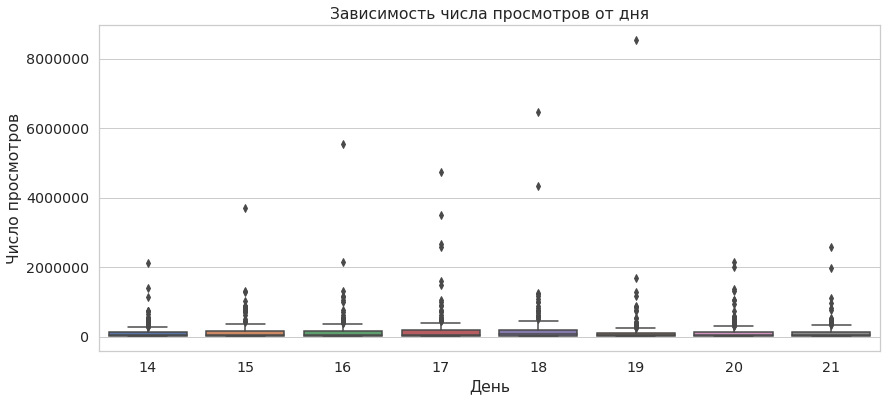

In [22]:
plt.figure(figsize=(14,6))
sns.boxplot('trending_date', 'views', data=videos)
plt.title('Зависимость числа просмотров от дня')
plt.xlabel('День')
plt.ylabel('Число просмотров')
plt.show()

Выбросам плохо, из-за них ничего не видно.

Исправьте этот недостаток, установив некоторое значение. 

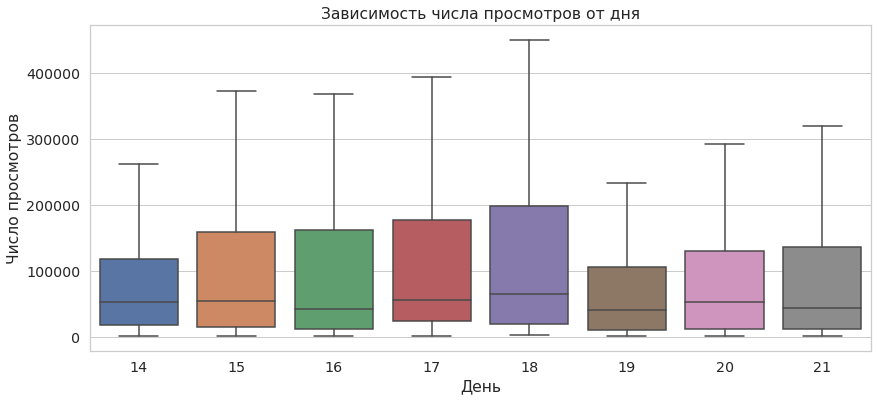

In [23]:
plt.figure(figsize=(14,6))
sns.boxplot('trending_date', 'views', data=videos, showfliers=False)
plt.title('Зависимость числа просмотров от дня')
plt.xlabel('День')
plt.ylabel('Число просмотров')
plt.show()

Постройте jointplot по всем данным для количества просмотров по горизонтальной оси и количества лайков по вертикальной. Насколько информативен такой график?

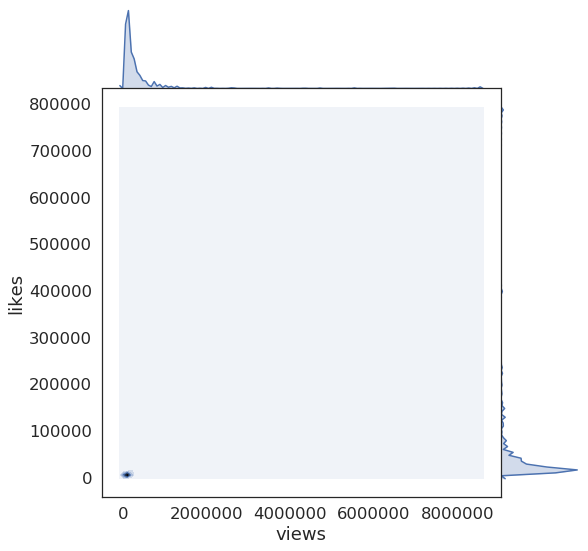

In [24]:
with sns.plotting_context("notebook", font_scale=1.5), sns.axes_style("white"):
    sns.jointplot(videos.views, videos.likes, kind='kde', height=8, space=0)

Опять выбросы всё испортили...

Исправьте этот недостаток.

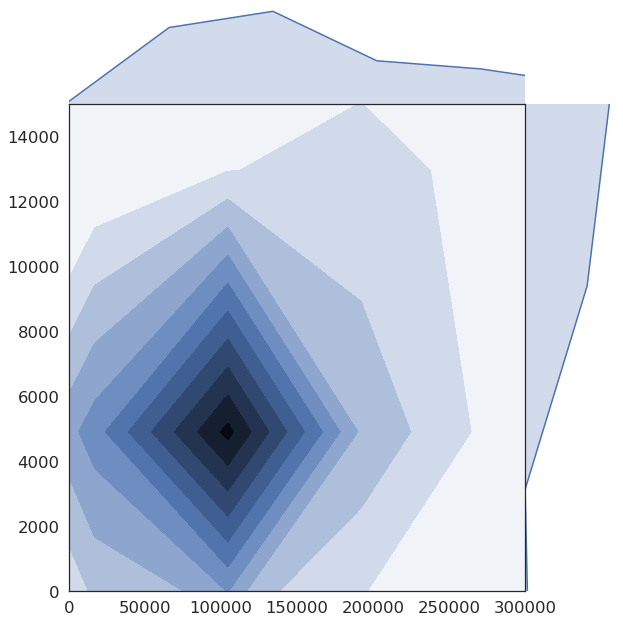

In [25]:
with sns.plotting_context("notebook", font_scale=1.5), sns.axes_style("white"):
    sns.jointplot(
        videos.views.to_numpy(),
        videos.likes.to_numpy(),
        kind='kde', height=9, space=0,
        xlim=(0,300000), ylim=(0,15000)
    )

Всё равно что-то не очень красиво. Давайте сделаем небольшой фокус

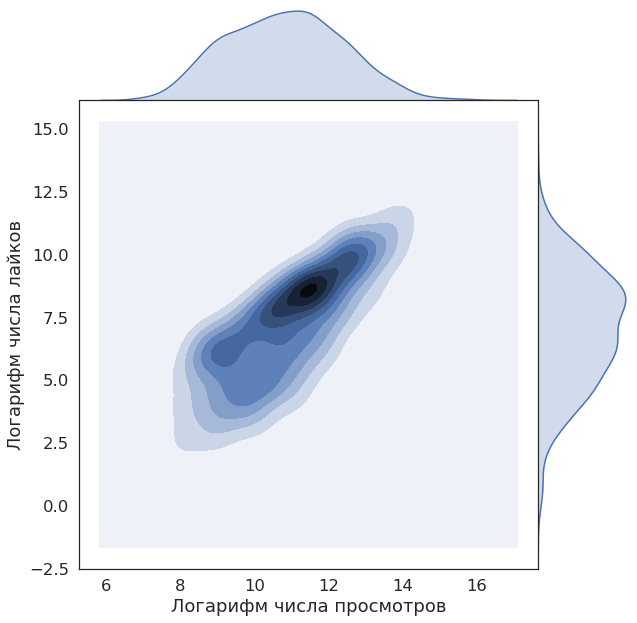

In [26]:
likes = videos[videos.likes > 0].likes.to_numpy()
views = videos[videos.likes > 0].views.to_numpy()

with sns.plotting_context("notebook", font_scale=1.5), sns.axes_style("white"):
    sns.jointplot(
        pd.Series(np.log(views), name='Логарифм числа просмотров'),
        pd.Series(np.log(likes), name='Логарифм числа лайков'),
        kind='kde', height=9, space=0
    )


---
## Сложная часть

### Задача 3

Netflix за последние 5-10 лет обзавелись большим количеством зрителей. С увеличением числа зрителей увеличилось и разнообразие шоу. Соответственно, перед аналитиками из киноиндустрии встала задача исследования данных с рейтингами различных сериалов.  
В данном задании вам предстоит провести визуальный анализ датасета **1000 Netflix Shows** (по состоянию на 11.06.2017) и сделать выводы.  


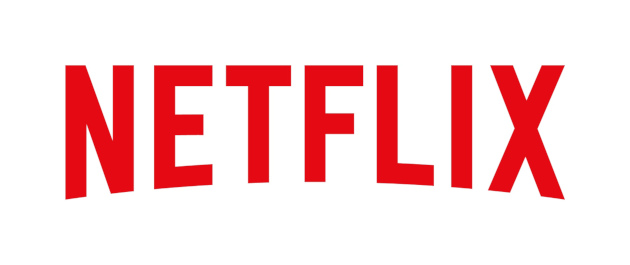

Описание признаков:
* `title` - название шоу.
* `rating` - рейтинг шоу. Например: G, PG, TV-14, TV-MA
* `ratingLevel` - описание рейтинговой группы и особенностей шоу.
* `release year` - год выпуска шоу.
* `user rating score` - оценка пользователей.


Загрузите данные, выполнив код ниже.

In [27]:
# код ниже менять нельзя (кроме пути до данных), просто запустите ячейку!
data = pd.read_csv('data/netflix_data.csv', encoding='cp437')
del data['ratingDescription'], data['user rating size']

In [28]:
data.head(10)

,title,rating,ratingLevel,release year,user rating score
0,White Chicks,PG-13,"crude and sexual humor, language and some drug...",2004,82.0
1,Lucky Number Slevin,R,"strong violence, sexual content and adult lang...",2006,NaN
2,Grey's Anatomy,TV-14,Parents strongly cautioned. May be unsuitable ...,2016,98.0
3,Prison Break,TV-14,Parents strongly cautioned. May be unsuitable ...,2008,98.0
4,How I Met Your Mother,TV-PG,Parental guidance suggested. May not be suitab...,2014,94.0
5,Supernatural,TV-14,Parents strongly cautioned. May be unsuitable ...,2016,95.0
6,Breaking Bad,TV-MA,For mature audiences. May not be suitable for...,2013,97.0
7,The Vampire Diaries,TV-14,Parents strongly cautioned. May be unsuitable ...,2017,91.0
8,The Walking Dead,TV-MA,For mature audiences. May not be suitable for...,2015,98.0
9,Pretty Little Liars,TV-14,Parents strongly cautioned. May be unsuitable ...,2016,96.0


Удалите из данных дупликаты. Сколько объектов удалено?

In [29]:
old_size = len(data)
data.drop_duplicates(inplace=True)
old_size - len(data)

500

Половину удалили...

Сколько объектов осталось?

In [30]:
len(data)

500

Сколько рейтинговых групп представлено в данных?

In [31]:
data.rating.nunique()

13

Какие оценки пользователи ставят чаще? Постройте гистограмму оценок.

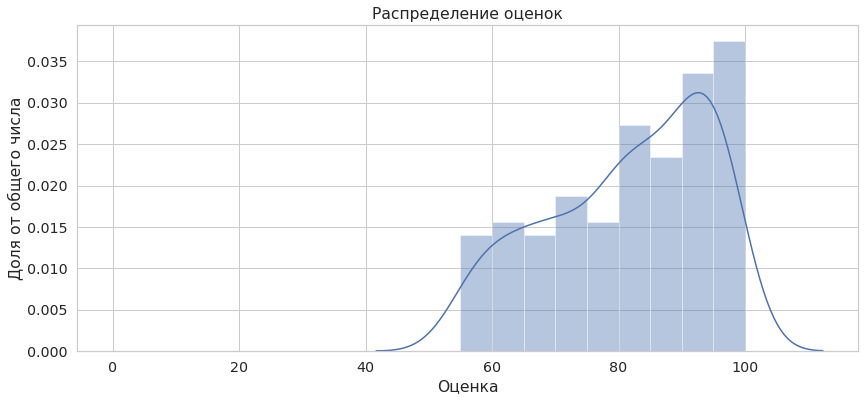

In [32]:
plt.figure(figsize=(14,6))
\
sns.distplot(
    data['user rating score'].dropna(),
    bins=np.linspace(0, 100, 21)
)
plt.title('Распределение оценок')
plt.xlabel('Оценка')
plt.ylabel('Доля от общего числа')
plt.show()

**Вывод:** пользователи охотнее ставят высокие оценки, больше половины оценок выше 80. Возможно, просто подборка из сериалов с неплохим рейтингом была.

Выведите основную информацию об оценках пользователей: среднее, стандартное отклонение, минимум, максимум, медиана. Отличаются ли медиана и среднее? Могут ли данные характеристики значительно отличаться? Почему?

In [33]:
data['user rating score'].describe()

count    256.000000
mean      81.398438
std       12.730904
min       55.000000
25%       71.000000
50%       83.500000
75%       93.000000
max       99.000000
Name: user rating score, dtype: float64

**Ответ:** в теории медиана и среднее могут отличаться и часто отличаются, но не могут делать это слишком сильно. Из теории вероятностей известно, что $|\mathrm{E} X - \mu(X)|\leq\sqrt{\mathrm{D} X}$, где $\mu(X)$ --- медиана случайной величины $X$. Поскольку оценка --- дискретная величина, то она обладает конечной дисперсией, соответственно отклонение медианы от среднего (которое совпадает с матожиданием) ограничено.

В какие годы были запущены шоу, представленные в датасете?

In [34]:
years = data['release year'].unique()
years.sort()
print(years)

[1940 1976 1978 1982 1986 1987 1989 1990 1991 1992 1993 1994 1995 1996
 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010
 2011 2012 2013 2014 2015 2016 2017]


Постройте график, показывающий распределение количества запущенных шоу в зависимости от года. Наблюдается ли рост? Есть ли выбросы?

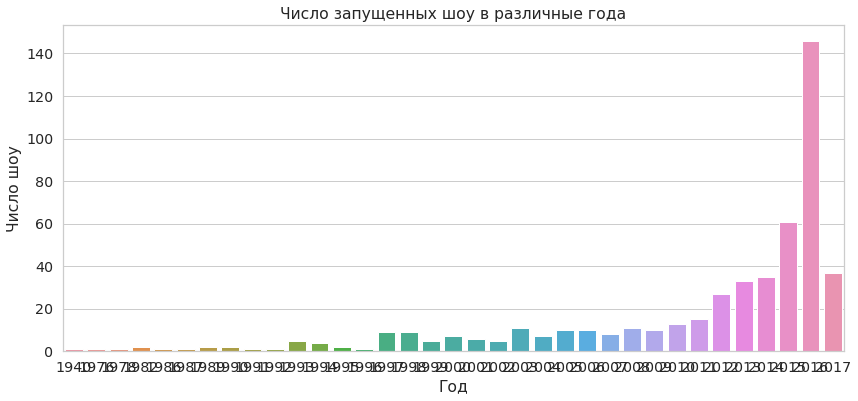

In [35]:
plt.figure(figsize=(14,6))
sns.countplot(data['release year'])
plt.title('Число запущенных шоу в различные года')
plt.xlabel('Год')
plt.ylabel('Число шоу')
plt.show()

Отвратительно. Давайте забудем про дела давно минувших дней

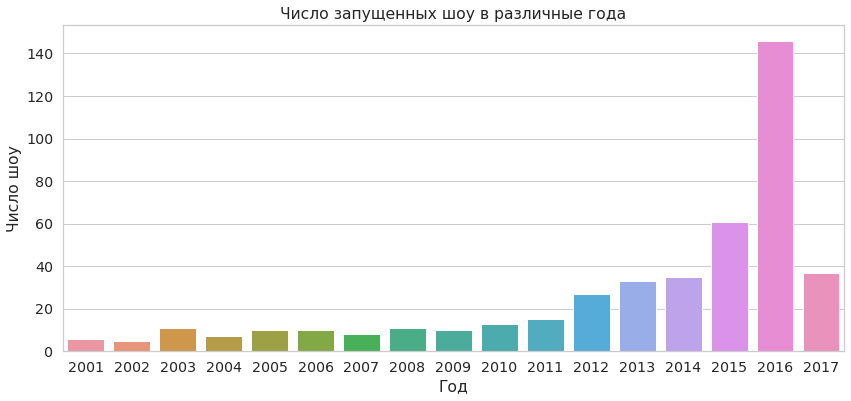

In [36]:
plt.figure(figsize=(14,6))
sns.countplot(data[data['release year'] >= 2001]['release year'])
plt.title('Число запущенных шоу в различные года')
plt.xlabel('Год')
plt.ylabel('Число шоу')
plt.show()

**Вывод:** некоторая тенденция к росту прослеживается, но 2016 год явно был выдающимся.

Сравните среднюю оценку пользователей в 2016 со средней оценкой в 2017. Можно ли сделать вывод, что 2017 год успешнее для Netflix? ("Успешнее" значит, что пользователи в среднем ставили более высокие оценки)
Ответить на этот вопрос вам поможет график, который вы построили выше.

In [37]:
data[data['release year'] == 2016]['user rating score'].describe()

count    86.000000
mean     84.313953
std      12.599030
min      56.000000
25%      77.000000
50%      89.000000
75%      95.000000
max      98.000000
Name: user rating score, dtype: float64

In [38]:
data[data['release year'] == 2017]['user rating score'].describe()

count    16.000000
mean     88.125000
std       8.585841
min      71.000000
25%      81.750000
50%      90.500000
75%      94.000000
max      99.000000
Name: user rating score, dtype: float64

**Вывод:** все показатели, кроме отметки 75%, в 2017 году выше. Однако оценок в 2017 году меньше, так как было запущено гораздо меньше шоу. Как итог, 2016 точно был коммерчески более успешным годом.

Ниже представлены два графика, показывающие распределение шоу по рейтинговым группам. Какой тип графика визуально более интерпретируемый? ([Подсказка](https://sun9-40.userapi.com/c854228/v854228652/c754f/j6z5gMjJy2k.jpg))  
Постройтре самостоятельно график, который считаете более интерпретируемым. Сделайте вывод.

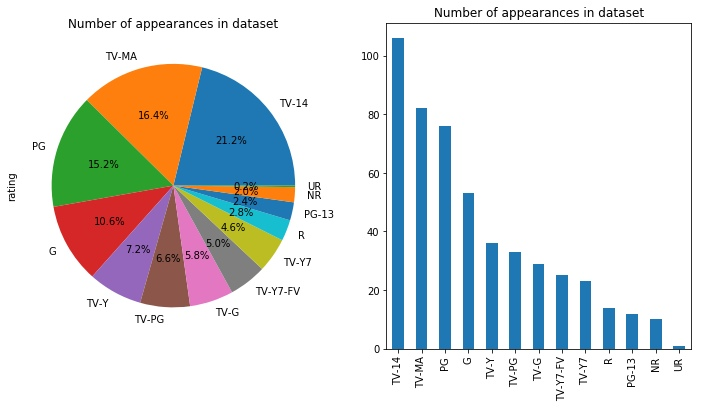

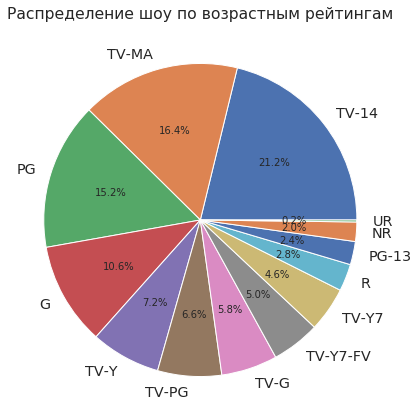

In [39]:
ratings = data.groupby('rating').count().sort_values('title', ascending=False)

plt.figure(figsize=(14,6))
plt.title('Распределение шоу по возрастным рейтингам', y=1.1)
plt.pie(
    ratings.title,
    labels=ratings.index,
    radius=1.2,
    autopct='%.1f%%'
)
plt.show()

**Вывод:** Самый распространённый рейтинг -- 14+, за ним идёт 17+. Больше половины контента детям рекомендуется смотреть только вместе с родителями. Судя по всему, в США черноватый юмор и пошлость пользуются популярностью у зрителей, поэтому продюссеры не брезгуют этими приёмами в шоу. В то же время, шоу, которые детям без родителей смотреть нельзя, составляют меньше 3% от всех, то есть продюссеры стараются сбалансировать и не довести до такого возрастного рейтинга.

Составьте топ-13 самых высоко оцененных шоу. Выберите из данного топа шоу, которое вам наиболее нравится (либо используйте `scipy.stats.randint`). Обозначим это шоу N.
Ответьте на следующие вопросы:  
* Какое шоу является худшим по оценкам в рейтинговой группе, к которой принадлежит N?  
* Сколько шоу было выпущено в одном году с N?  
* Насколько бы изменилась средняя оценка шоу, выпущенных в одном году с N, если бы Netflix не запустили шоу N?

In [40]:
data_with_score =\
    data.copy().dropna()\
    .sort_values('user rating score', ascending=False)
data_with_score.head(13)

,title,rating,ratingLevel,release year,user rating score
41,13 Reasons Why,TV-MA,For mature audiences. May not be suitable for...,2017,99.0
63,Criminal Minds,TV-14,Parents strongly cautioned. May be unsuitable ...,2016,98.0
3,Prison Break,TV-14,Parents strongly cautioned. May be unsuitable ...,2008,98.0
64,Friends,TV-14,Parents strongly cautioned. May be unsuitable ...,2003,98.0
2,Grey's Anatomy,TV-14,Parents strongly cautioned. May be unsuitable ...,2016,98.0
8,The Walking Dead,TV-MA,For mature audiences. May not be suitable for...,2015,98.0
10,Once Upon a Time,TV-PG,Parental guidance suggested. May not be suitab...,2016,98.0
27,The Flash,TV-PG,Parental guidance suggested. May not be suitab...,2016,98.0
350,Lost,TV-14,Parents strongly cautioned. May be unsuitable ...,2010,98.0
88,Finding Dory,PG,mild thematic elements,2016,98.0


Я выберу Family Guy.

In [41]:
selected = data_with_score[data_with_score.title == 'Family Guy']
selected

,title,rating,ratingLevel,release year,user rating score
62,Family Guy,TV-MA,For mature audiences. May not be suitable for...,2015,98.0


Найдём худшее в той же возрастной категории:

In [42]:
same_rating = data_with_score[data_with_score.rating == selected.rating.item()]
same_rating.sort_values('user rating score').head(1)

/home/ab1/.conda/envs/default/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning:

`item` has been deprecated and will be removed in a future version



,title,rating,ratingLevel,release year,user rating score
380,Bitten,TV-MA,For mature audiences. May not be suitable for...,2016,56.0


Найдем количество выпущенных в тот же год:

In [43]:
released_same_year = data[data['release year'] == selected['release year'].item()]
len(released_same_year)

/home/ab1/.conda/envs/default/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning:

`item` has been deprecated and will be removed in a future version



61

Посчитаем изменение средней оценки:

In [44]:
released_same_year.dropna()
mean_including = released_same_year.mean()['user rating score']
mean_excluding =\
    released_same_year[released_same_year.title != selected.title.item()]\
    .mean()['user rating score']
print('Средняя оценка уменьшилась бы на {:.2} балла'\
      .format(- mean_excluding + mean_including))

Средняя оценка уменьшилась бы на 0.49 балла


/home/ab1/.conda/envs/default/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning:

`item` has been deprecated and will be removed in a future version



Ответьте на следующие вопросы при помощи `boxplot`:
* Какую рейтинговую группу зрители оценивали выше всего в последние пять лет? 
* Как менялись оценки пользователей с течением времени? Постройте `boxplot` для каждого десятилетия.

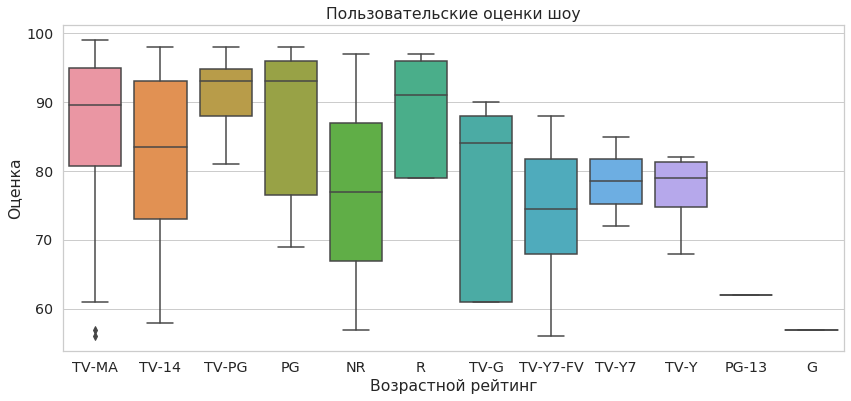

In [45]:
plt.figure(figsize=(14,6))
sns.boxplot('rating', 'user rating score', data=data_with_score[data_with_score['release year'] >= 2013])
plt.title('Пользовательские оценки шоу')
plt.xlabel('Возрастной рейтинг')
plt.ylabel('Оценка')
plt.show()

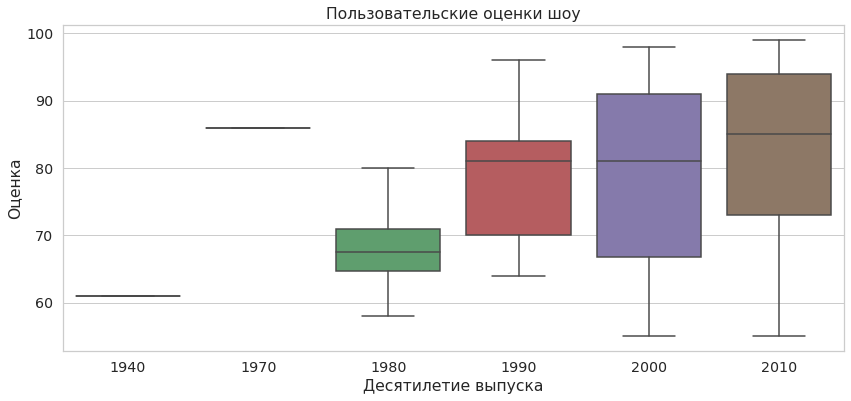

In [46]:
data_with_score['decade'] = data_with_score['release year'] // 10 * 10

plt.figure(figsize=(14,6))
sns.boxplot('decade', 'user rating score', data=data_with_score)
plt.title('Пользовательские оценки шоу')
plt.xlabel('Десятилетие выпуска')
plt.ylabel('Оценка')
plt.show()

**Вывод:** По максимальной оценке лидирует возрастной рейтинг 17+, по медианной -- шоу, которые детям рекомендуется смотреть вместе с родителями. В целом, эти категории близки. Также наблюдается рост максимальной и медианной оценок между последними деситялетиями. Это может быть связано как с ростом качества шоу, так и с расширением аудитории и как следствие снижением критичности оценок.

---
### Задача 4

В данной задаче вам нужно будет продолжить анализ данных о видео на YouTube. Информация об имени категории видео содержится в файле `RU_category_id.json`. Следующий код читает этот файл, извлекает из него необходимую информацию, и записывает в виде `pandas`-таблицы.

In [47]:
import json

with open('data/RU_category_id.json') as json_file:
    json_data = json.load(json_file)
    
category = pd.DataFrame(columns=['id', 'name'])

for item in json_data['items']:
    category = category.append(
        {'id': int(item['id']),
         'name': item['snippet']['title']},
        ignore_index=True
    )
    
category['id'] = category['id'].astype(int)
category

,id,name
0,1,Film & Animation
1,2,Autos & Vehicles
2,10,Music
3,15,Pets & Animals
4,17,Sports
5,18,Short Movies
6,19,Travel & Events
7,20,Gaming
8,21,Videoblogging
9,22,People & Blogs


Добавьте к вашим данным имена категорий с помощью `pd.merge`.

In [48]:
videos = videos.merge(category, left_on='category_id', right_on='id')
del videos['id']
videos.head(10)

,trending_date,category_id,views,likes,dislikes,comment_count,name
0,14,22,62408,334,190,50,People & Blogs
1,14,22,330043,43841,2244,2977,People & Blogs
2,14,22,112851,3566,122,80,People & Blogs
3,14,22,97006,2259,330,887,People & Blogs
4,14,22,148974,5434,5247,1612,People & Blogs
5,14,22,332741,8358,2228,966,People & Blogs
6,14,22,79197,225,343,119,People & Blogs
7,14,22,77786,1769,290,1689,People & Blogs
8,14,22,539625,24904,3205,3803,People & Blogs
9,14,22,67840,19,638,99,People & Blogs


Составьте сводную таблицу о количестве просмотров по дням для каждой категории видео с помощю функции `pivot_table`.

In [49]:
views_table = videos.pivot_table(index='name',
                                 columns='trending_date',
                                 values='views',
                                 aggfunc='sum',
                                 fill_value=0)
views_table

trending_date,14,15,16,17,18,19,20,21
name,,,,,,,,
Autos & Vehicles,1350890,2076443,2051608,1386676,1713087,1736740,962761,1421017
Comedy,2310887,4152389,4156893,3556025,3806238,3556578,5648120,4627423
Education,139723,28850,6963,146943,256076,310830,270585,186909
Entertainment,5010384,5289490,3373346,12299938,7519942,5877590,8174020,4585563
Film & Animation,636616,931837,1160112,1820958,2725012,1075440,2574276,2532978
Gaming,885597,1609621,1583149,557074,600307,193316,851814,981217
Howto & Style,2191619,1562421,129763,1250164,1468139,156958,1402284,350009
Music,733907,1585619,4720464,9179397,6972429,1329904,1527219,809274
News & Politics,1010044,1225112,1174092,1251367,1056007,1028665,657263,1214178


Визуализируйте таблицу с помощью `heatmap`. Для информативности поделите все числа на $10^6$.

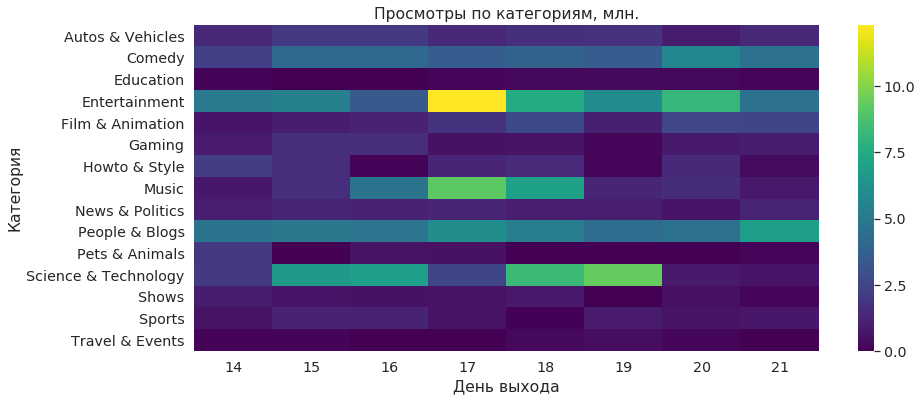

In [50]:
plt.figure(figsize=(14,6))
sns.heatmap(views_table / 1e6, cmap='viridis')
plt.title('Просмотры по категориям, млн.')
plt.xlabel('День выхода')
plt.ylabel('Категория')
plt.show()

Сделайте аналогичную сводную таблицу, добавив суммы по строкам и столбцам, назвав их "Всего просмотров".

In [51]:
views_table_ext = views_table.copy()
views_table_ext['Всего просмотров'] = views_table_ext.sum(axis=1)
views_table_ext =\
    views_table_ext.append(
        pd.Series(views_table_ext.sum(),
                  name='Всего просмотров')
    )
views_table_ext

trending_date,14,15,16,17,18,19,20,21,Всего просмотров
name,,,,,,,,,
Autos & Vehicles,1350890,2076443,2051608,1386676,1713087,1736740,962761,1421017,12699222
Comedy,2310887,4152389,4156893,3556025,3806238,3556578,5648120,4627423,31814553
Education,139723,28850,6963,146943,256076,310830,270585,186909,1346879
Entertainment,5010384,5289490,3373346,12299938,7519942,5877590,8174020,4585563,52130273
Film & Animation,636616,931837,1160112,1820958,2725012,1075440,2574276,2532978,13457229
Gaming,885597,1609621,1583149,557074,600307,193316,851814,981217,7262095
Howto & Style,2191619,1562421,129763,1250164,1468139,156958,1402284,350009,8511357
Music,733907,1585619,4720464,9179397,6972429,1329904,1527219,809274,26858213
News & Politics,1010044,1225112,1174092,1251367,1056007,1028665,657263,1214178,8616728


В чем проблема с информативностью подобных таблиц? Исправьте это.

*Подсказка*: посмотрите на графики, которые вы построили ранее. 

1. Глаза разбегаются, не так ли? Наверное, если посортировать, будет удобнее

In [52]:
views_table_ext.sort_values('Всего просмотров', ascending=True)

trending_date,14,15,16,17,18,19,20,21,Всего просмотров
name,,,,,,,,,
Travel & Events,104076,136549,2271,0,253369,406558,186876,26321,1116020
Education,139723,28850,6963,146943,256076,310830,270585,186909,1346879
Pets & Animals,2013597,0,608073,541708,16179,12928,8792,164127,3365404
Shows,951608,656799,548936,609770,808860,0,491488,164981,4232442
Sports,608587,1181720,1193647,577087,64261,911646,600913,722192,5860053
Gaming,885597,1609621,1583149,557074,600307,193316,851814,981217,7262095
Howto & Style,2191619,1562421,129763,1250164,1468139,156958,1402284,350009,8511357
News & Politics,1010044,1225112,1174092,1251367,1056007,1028665,657263,1214178,8616728
Autos & Vehicles,1350890,2076443,2051608,1386676,1713087,1736740,962761,1421017,12699222


2. На чиселки не особо наглядно смотреть, соотношение просмотров непонятно. Давайте посмотрим на круговую диаграмму.

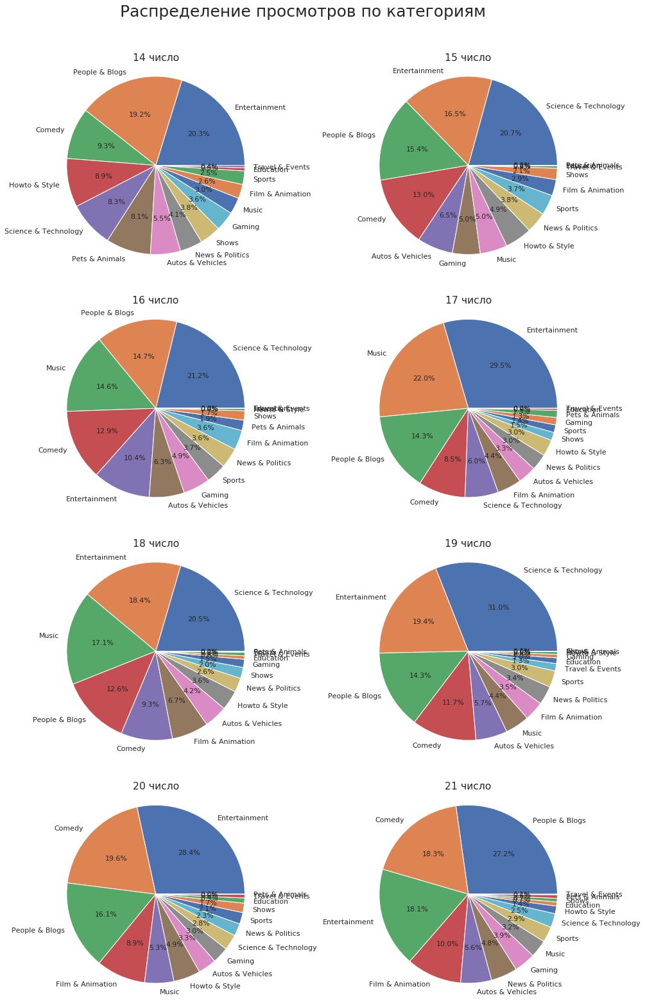

In [53]:
fig, axes = plt.subplots(4, 2, figsize=(16, 26))
plt.subplots_adjust(top=0.9)

plt.suptitle('Распределение просмотров по категориям', fontsize=25, y=0.95)
for ax, col in zip(axes.flat, views_table_ext.columns):
    data = views_table_ext[col][:-1].sort_values(ascending=False)
    ax.set_title('{} число'.format(col), y=1.0)
    ax.pie(
        data,
        labels=data.index,
        radius=1.1,
        textprops={'fontsize': 11},
        autopct='%.1f%%'
    )
plt.show()

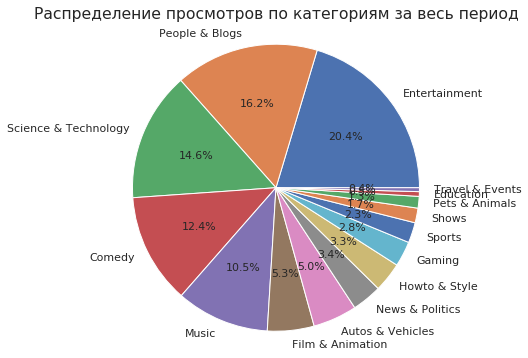

In [54]:
plt.figure(figsize=(14, 6))
data = views_table_ext['Всего просмотров'][:-1].sort_values(ascending=False)
plt.title('Распределение просмотров по категориям за весь период')
plt.pie(
    data,
    labels=data.index,
    radius=1.1,
    textprops={'fontsize': 11},
    autopct='%.1f%%'
)
plt.show()

**Вывод:** самая просматриваемая категория видео --- развлечения, за ними следуют личные блоги. Как ни странно, научно-технические видео также достаточно популярны.

---

### Задача 5

Yelp (yelp.com) — веб-сайт для поиска на местном рынке услуг, например ресторанов или парикмахерских, с возможностью добавлять и просматривать рейтинги и обзоры этих услуг. Для популярных бизнесов имеются сотни обзоров. Для обозревателей на сайте предусмотрены элементы социальной сети.

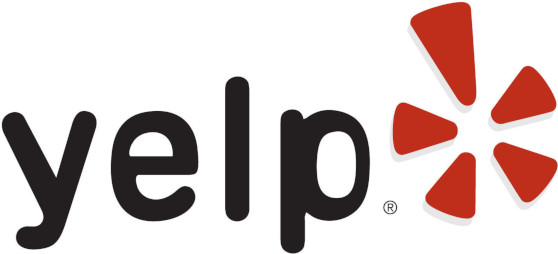

_____________

Вам предоставляется следующая информация о компаниях на Yelp:

Файл `yelp_business.csv`:
* `business_id` — уникальный идентификатор компании;
* `name` — имя компании;
* `address`, `city`, `state` — месторасположении компании;
* `latitude`, `longitude` — географические координаты;
* `categories` — категории услуг компании.

Файл `yelp_review.csv`, содержащий оценки пользователей:
* `business_id` — идентификатор компании, соответствующий файлу `yelp_business.csv`;
* `stars` — поставленная пользователем оценка от 1 до 5.

В целях сокращения объема файла, текстовые отзывы пользователей не были включены.

Оригинальную версию датасета в формате json можно посмотреть по ссылке
https://www.kaggle.com/yelp-dataset/yelp-dataset/data

_____________

**Что нужно сделать:** 

* Найти город с наибольшим количеством компаний;
* Для этого города определить районы с наиболее качественными услугами. Пример с несколько другой задачей: https://yandex.ru/company/researches/2017/msk_mobile_map
* А также найти рестораны с наилучшими отзывами.

------

#### Город с наибольшим количеством компаний

Загрузите данные из файла `yelp_business.csv` с помощью функции `pd.read_csv`. Посмотрите на первые несколько строк с помощью метода `head`.

In [55]:
business = pd.read_csv('data/yelp_business.csv', index_col=0)
business.head()

,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,is_open,categories
0,FYWN1wneV18bWNgQjJ2GNg,"""Dental by Design""",NaN,"""4855 E Warner Rd, Ste B9""",Ahwatukee,AZ,85044,33.330690,-111.978599,1,Dentists;General Dentistry;Health & Medical;Or...
1,He-G7vWjzVUysIKrfNbPUQ,"""Stephen Szabo Salon""",NaN,"""3101 Washington Rd""",McMurray,PA,15317,40.291685,-80.104900,1,Hair Stylists;Hair Salons;Men's Hair Salons;Bl...
2,KQPW8lFf1y5BT2MxiSZ3QA,"""Western Motor Vehicle""",NaN,"""6025 N 27th Ave, Ste 1""",Phoenix,AZ,85017,33.524903,-112.115310,1,Departments of Motor Vehicles;Public Services ...
3,8DShNS-LuFqpEWIp0HxijA,"""Sports Authority""",NaN,"""5000 Arizona Mills Cr, Ste 435""",Tempe,AZ,85282,33.383147,-111.964725,0,Sporting Goods;Shopping
4,PfOCPjBrlQAnz__NXj9h_w,"""Brick House Tavern + Tap""",NaN,"""581 Howe Ave""",Cuyahoga Falls,OH,44221,41.119535,-81.475690,1,American (New);Nightlife;Bars;Sandwiches;Ameri...


Найдите пять городов, по которым присутствует информация о наибольшем количестве компаний. Для этого стоит воспользоваться методами `groupby`, `count`, `sort_values`, `head`. В таблице должен быть указан город (название) и количество компаний в этом городе.

In [56]:
cities =\
    business.groupby('city')\
    .count().rename(columns={'business_id': 'num_companies'})[['num_companies']]\
    .sort_values('num_companies', ascending=False)
cities.head(5)

,num_companies
city,
Las Vegas,26775
Phoenix,17213
Toronto,17206
Charlotte,8553
Scottsdale,8228


Пусть N -- город с наибольшим количеством компаний.

Оставьте в таблице только записи, соответствующие городу N. Нанесите все эти компании на график, в котором по оси $x$ отметьте долготу, а по оси $y$ -- долготу.

In [57]:
selected = cities.head(1).index.item()
selected

/home/ab1/.conda/envs/default/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning:

`item` has been deprecated and will be removed in a future version



'Las Vegas'

In [58]:
business = business[business.city == selected]
business.head()

,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,is_open,categories
6,kCoE3jvEtg6UVz5SOD3GVw,"""BDJ Realty""",Summerlin,"""2620 Regatta Dr, Ste 102""",Las Vegas,NV,89128,36.207430,-115.268460,1,Real Estate Services;Real Estate;Home Services...
7,OD2hnuuTJI9uotcKycxg1A,"""Soccer Zone""",NaN,"""7240 W Lake Mead Blvd, Ste 4""",Las Vegas,NV,89128,36.197484,-115.249660,1,Shopping;Sporting Goods
26,VBHEsoXQb2AQ76J9l8h1uQ,"""Alfredo's Jewelry""",Southeast,"""5775 S Eastern, Ste 103""",Las Vegas,NV,89119,36.085051,-115.119421,1,Shopping;Jewelry;Watch Repair;Local Services
41,1Jp_hmPNUZArNqzpbm7B0g,"""Task Electric""",Spring Valley,"""7260 Cimarron Rd, Ste 130""",Las Vegas,NV,89113,36.056382,-115.269332,1,Home Services;Lighting Fixtures & Equipment;Lo...
48,DPQnTnNw2PJj7DdENM98Cw,"""Star Nursery""",NaN,"""5340 Boulder Hwy""",Las Vegas,NV,89122,36.105196,-115.056880,1,Nurseries & Gardening;Home & Garden;Shopping


Нанесём широту и долготу на график:

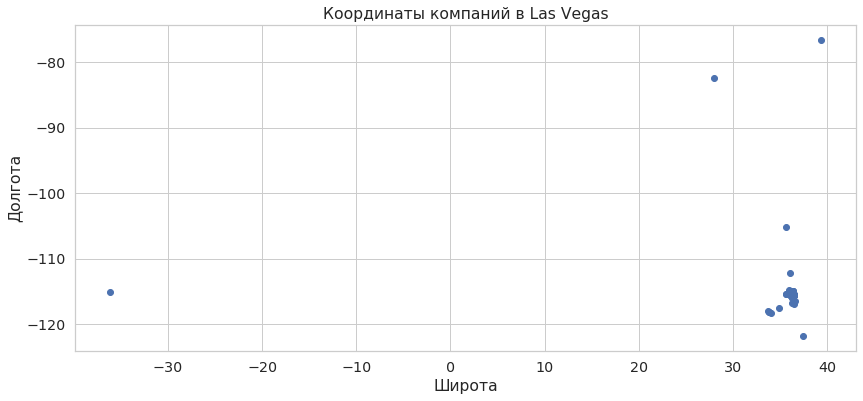

In [59]:
plt.figure(figsize=(14, 6))
plt.scatter(
    business.latitude,
    business.longitude
)
plt.title('Координаты компаний в {}'.format(selected))
plt.xlabel('Широта')
plt.ylabel('Долгота')
plt.show()

Сам город находится в сгустке точек. Есть какие-то компании, которые приписаны к этому городу, но находятся далеко от него. Избавьтесь от них, подобрав некоторые границы значений широты и долготы. Изобразите все компании на новом графике. 

На этом графике должны выделяться некоторые улицы. Откройте карту города N и сравните ее с построенным графиком.

Попробуйте также автоматически подгружать карту города в качестве фона графика. <a href="https://plotly.com/python/scattermapbox/">Примеры.</a>

Подберём границы:

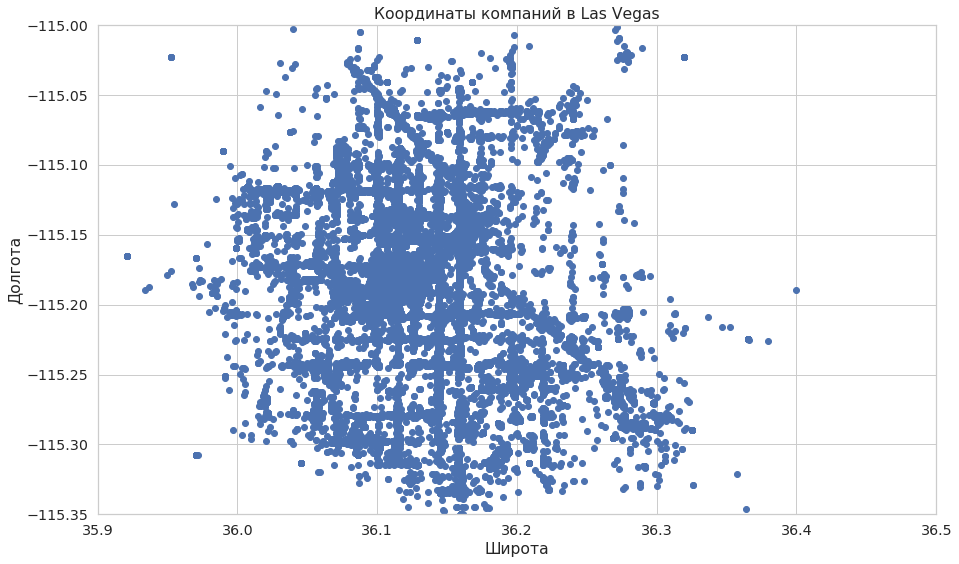

In [60]:
fig, ax = plt.subplots(figsize=(16, 9))
plt.scatter(
    business.latitude,
    business.longitude
)
plt.xlim(35.9, 36.5)
plt.ylim(-115.35, -115)
plt.title('Координаты компаний в {}'.format(selected))
plt.xlabel('Широта')
plt.ylabel('Долгота')
ax.set_aspect(1)
plt.show()

Улицы уже угадываются, неплохо.

In [61]:
fig = px.scatter_mapbox(
    business,
    lat='latitude',
    lon='longitude',
    hover_name='name',
    opacity=0.5,
    zoom=10
)
fig.show()

#### Оценки компаний

Для выполнения задания нужно посчитать среднюю оценку каждой компании, а также количество выставленных оценок.

Загрузите таблицу оценок `yelp_review.csv`.

In [62]:
reviews = pd.read_csv('data/yelp_review.csv')
del reviews['Unnamed: 0']
reviews.head()

,business_id,stars
0,AEx2SYEUJmTxVVB18LlCwA,5
1,VR6GpWIda3SfvPC-lg9H3w,5
2,CKC0-MOWMqoeWf6s-szl8g,5
3,ACFtxLv8pGrrxMm6EgjreA,4
4,s2I_Ni76bjJNK9yG60iD-Q,4


В подгруженной таблице оценок оставьте только компании города N. Для этого установите значения `business_id` в качестве индекса у таблицы оценок и воспользуйтесь методом `loc`. Чтобы индекс снова сделать полем таблицы, можно воспользоваться методом `reset_index`.

In [63]:
reviews = reviews.set_index('business_id').loc[business.business_id].reset_index()
reviews.head()

,business_id,stars
0,kCoE3jvEtg6UVz5SOD3GVw,4
1,kCoE3jvEtg6UVz5SOD3GVw,1
2,kCoE3jvEtg6UVz5SOD3GVw,5
3,kCoE3jvEtg6UVz5SOD3GVw,5
4,kCoE3jvEtg6UVz5SOD3GVw,5


Теперь посчитайте среднюю оценку каждой компании, а также количество выставленных компании оценок. Помочь в этом могут функции `groupby` и `aggregate([np.mean, np.size])`.

In [64]:
rating = reviews.groupby('business_id').aggregate([np.mean, np.size])
rating.head()

stars      
                            mean  size
business_id                           
--9e1ONYQuAa-CB_Rrw7Tw  4.088904  1451
--DdmeR16TRb3LsjG0ejrQ  3.200000     5
--WsruI0IGEoeRmkErU5Gg  4.928571    14
--Y7NhBKzLTbNliMUX_wfg  4.875000     8
--e8PjCNhEz32pprnPhCwQ  3.473684    19

Назовите колонки таблицы красивыми именами, изменив `<имя таблицы>.columns`, после чего напечатайте несколько строк полученной таблицы.

In [65]:
rating.columns = rating.columns.droplevel()
rating = rating.rename(columns={'mean': 'stars', 'size': 'count'})
rating.head()

,stars,count
business_id,,
--9e1ONYQuAa-CB_Rrw7Tw,4.088904,1451
--DdmeR16TRb3LsjG0ejrQ,3.200000,5
--WsruI0IGEoeRmkErU5Gg,4.928571,14
--Y7NhBKzLTbNliMUX_wfg,4.875000,8
--e8PjCNhEz32pprnPhCwQ,3.473684,19


Соедините две полученные ранее таблицы по компаниям города N в одну.
Для этого сначала установите поле `business_id` в качестве индекса в обеих таблицах с помощью `set_index` (в одной из них это уже должно было быть сделано).
Соединение таблиц можно выполнить с помощью `join`.
Индексы у этих таблиц одинаковые, так что тип джойна не имеет значения.
В полученной таблице должны получится поля `latitude`, `longitude`, `categories`, `name`, `stars`, `count`.

In [66]:
business_rated = business.set_index('business_id').join(rating)
business_rated = business_rated[[
    'latitude',
    'longitude',
    'categories',
    'name',
    'stars',
    'count'
]]
business_rated.head()

,latitude,longitude,categories,name,stars,count
business_id,,,,,,
kCoE3jvEtg6UVz5SOD3GVw,36.207430,-115.268460,Real Estate Services;Real Estate;Home Services...,"""BDJ Realty""",4.000000,5
OD2hnuuTJI9uotcKycxg1A,36.197484,-115.249660,Shopping;Sporting Goods,"""Soccer Zone""",1.444444,9
VBHEsoXQb2AQ76J9l8h1uQ,36.085051,-115.119421,Shopping;Jewelry;Watch Repair;Local Services,"""Alfredo's Jewelry""",4.739130,23
1Jp_hmPNUZArNqzpbm7B0g,36.056382,-115.269332,Home Services;Lighting Fixtures & Equipment;Lo...,"""Task Electric""",4.450000,20
DPQnTnNw2PJj7DdENM98Cw,36.105196,-115.056880,Nurseries & Gardening;Home & Garden;Shopping,"""Star Nursery""",3.680000,25


Изобразите все компании на графике, раскрасив точку в цвет, оттенок которого соответствует средней оценке компании. Прозрачность точки выставляйте не более $0.3$.

In [67]:
fig = px.scatter_mapbox(
    business_rated,
    lat='latitude',
    lon='longitude',
    hover_name='name',
    color='stars',
    opacity=0.3,
    zoom=10,
    color_continuous_scale=px.colors.sequential.Viridis
)
fig.show()

Чтобы получить районы города, округлите значения широты и долготы, подобрав оптимальный размер района. Например, можно сделать так
`np.round(долгота*4, decimals=1)*0.25`.

In [68]:
lat_start = 35.95
lat_end = 36.35
lat_cnt = 5
lon_start = -115.35
lon_end = -115.0
lon_cnt = 6

lat_step = (lat_end - lat_start) / lat_cnt
lon_step = (lon_end - lon_start) / lon_cnt
business_rated['latitude_region'] = np.clip(
    ((business_rated.latitude - lat_start) // lat_step).astype(np.int64),
    0,
    lat_cnt - 1
)
business_rated['longitude_region'] = np.clip(
    ((business_rated.longitude - lon_start) // lon_step).astype(np.int64),
    0,
    lon_cnt - 1
)
business_rated.head()

,latitude,longitude,categories,name,stars,count,latitude_region,longitude_region
business_id,,,,,,,,
kCoE3jvEtg6UVz5SOD3GVw,36.207430,-115.268460,Real Estate Services;Real Estate;Home Services...,"""BDJ Realty""",4.000000,5,3,1
OD2hnuuTJI9uotcKycxg1A,36.197484,-115.249660,Shopping;Sporting Goods,"""Soccer Zone""",1.444444,9,3,1
VBHEsoXQb2AQ76J9l8h1uQ,36.085051,-115.119421,Shopping;Jewelry;Watch Repair;Local Services,"""Alfredo's Jewelry""",4.739130,23,1,3
1Jp_hmPNUZArNqzpbm7B0g,36.056382,-115.269332,Home Services;Lighting Fixtures & Equipment;Lo...,"""Task Electric""",4.450000,20,1,1
DPQnTnNw2PJj7DdENM98Cw,36.105196,-115.056880,Nurseries & Gardening;Home & Garden;Shopping,"""Star Nursery""",3.680000,25,1,5


Для получения средней оценки компании по району постройте сводную таблицу при помощи `pd.pivot_table`, взяв в качестве индексов и колонок округленные широту и долготу, а в качестве значений -- оценки. Аггрегирующей функцией является среднее.

Изобразите полученную таблицу при помощи `sns.heatmap`.

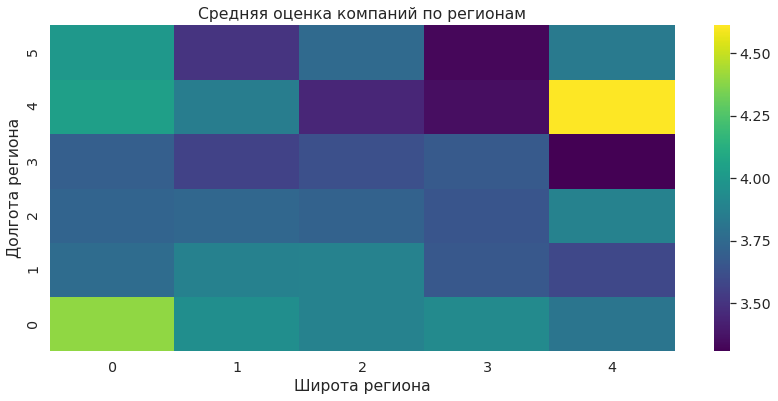

In [69]:
regions_stats = business_rated.pivot_table(
    columns='latitude_region',
    index='longitude_region',
    values='stars',
    aggfunc=np.mean
)

plt.figure(figsize=(14,6))
fig = sns.heatmap(regions_stats, cmap='viridis')
fig.invert_yaxis()
plt.title('Средняя оценка компаний по регионам')
plt.xlabel('Широта региона')
plt.ylabel('Долгота региона')
plt.show()

Полученный график имеет ряд недостатков. Во-первых, не очень правильно судить о районе, если в нем мало компаний. Во-вторых,  на графике цветовая гамма автоматически подстроилась под минимальное и максимальное значения оценки.

Почему эти недостатки могут быть существенными?

**Ответ:**
1. Отсутствует визуальная наглядность. Когда видишь бирюзовый цвет, думаешь, что это что-то средненькая оценка, а это может соответствовать оценке 4/5.

2. Когда мы смотрим на окраинные регионы, может сложиться впечатление, что в них сервис лучшего качества, чем в других местах, а на деле в этом регионе может быть одна компания.

Оставьте районы, в которых имеется информация о не менее $30$ компаний. Постройте новый график районов, использовав параметры `vmin` и `vmax` у функции `sns.heatmap`.

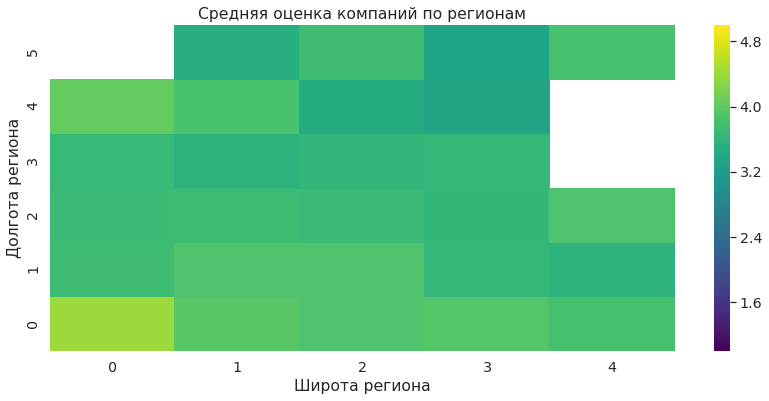

In [70]:
companies_count = business_rated.pivot_table(
    index='longitude_region',
    columns='latitude_region',
    values='name',
    aggfunc=np.size
)

plt.figure(figsize=(14,6))
fig = sns.heatmap(
    regions_stats[companies_count >= 30],
    cmap='viridis',
    vmin=1,
    vmax=5
)
fig.invert_yaxis()
plt.title('Средняя оценка компаний по регионам')
plt.xlabel('Широта региона')
plt.ylabel('Долгота региона')
plt.show()

Сравните полученный график с предыдущим и сделайте вывод.

**Вывод:** Среди выкинутых регионов есть как регион с самым низким рейтингом, так и с самым высоким. Также видно, что средние оценки всех регионов отличаются не очень сильно, на плохом экране отличия можно и не разглядеть

#### Рестораны

Будем считать компанию рестораном, если в поле `categories` *содержится* слово `Restaurant`. Составьте таблицу, в которой будет информация о всех ресторанах города N, для которых имеется не менее $5$ отзывов. Далее постройте график районов, в котором каждому району сопоставьте среднюю оценку по ресторанам этого района. Рассматривайте только те районы, в которых есть не менее $10$ ресторанов, для каждого из которых есть не менее $5$ отзывов.

In [71]:
restaurants = business_rated[
    business_rated.categories.str.contains('Restaurant') &
    (business_rated['count'] >= 5)
]
restaurants.head()

,latitude,longitude,categories,name,stars,count,latitude_region,longitude_region
business_id,,,,,,,,
Pd52CjgyEU3Rb8co6QfTPw,36.066914,-115.170848,Nightlife;Bars;Barbeque;Sports Bars;American (...,"""Flight Deck Bar & Grill""",3.769231,13,1,3
4srfPk1s8nlm1YusyDUbjg,36.064652,-115.118954,Fast Food;Restaurants;Sandwiches,"""Subway""",2.666667,6,1,3
n7V4cD-KqqE3OXk0irJTyA,36.068259,-115.178877,Arcades;Arts & Entertainment;Gastropubs;Restau...,"""GameWorks""",3.117479,349,1,2
Wpt0sFHcPtV5MO9He7yMKQ,36.130013,-115.109310,Restaurants;Fast Food;Burgers,"""McDonald's""",2.150000,20,2,4
W1Yr6c2XDx_RBjb6WsV-aQ,36.170706,-115.190288,Restaurants;Cafes;American (New);Bars;Nightlif...,"""Divine Cafe at the Springs Preserve""",4.050000,140,2,2


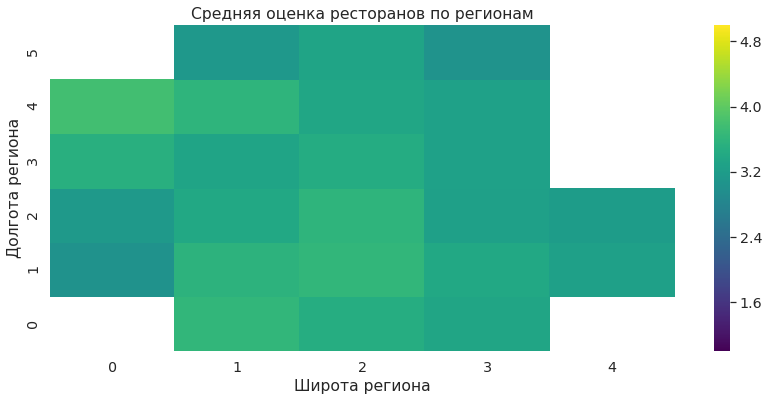

In [72]:
regions_rest = restaurants.pivot_table(
    index='longitude_region',
    columns='latitude_region',
    values='stars',
    aggfunc=np.mean
)
rest_count = restaurants.pivot_table(
    index='longitude_region',
    columns='latitude_region',
    values='name',
    aggfunc=np.size
)

plt.figure(figsize=(14,6))
fig = sns.heatmap(
    regions_rest[rest_count >= 10],
    cmap='viridis',
    vmin=1,
    vmax=5
)
fig.invert_yaxis()
plt.title('Средняя оценка ресторанов по регионам')
plt.xlabel('Широта региона')
plt.ylabel('Долгота региона')
plt.show()

Чем полезны ограничения снизу на количество отзывов для ресторана и количество ресторанов в районе?

**Ответ:** при маленьком количестве отзывов средняя оценка ресторана непоказательна, так как велик элемент случайности (человеку по какому-то недоразумению попал волос в еду и он поставил 1 или он случайно поставил 5). Точно так же и с количеством ресторанов в регионе -- если есть только один неплохой ресторан, это вовсе не значит, что в регионе будет где перекусить.

Кот Василий очень придирчив к выбору ресторана. Он доверяет только ресторанам с высоким рейтингом, который основывается на большом количестве отзывов. Напечатайте в виде таблицы информацию $10$ ресторанах с самым большим рейтингом в порядке убывания рейтинга. Для каждого из этих ресторанов должно быть не менее $50$ отзывов. По каждому ресторану необходимо вывести следующую информации: название ресторана, средняя оценка, количество отзывов, географические координаты, категории.

In [73]:
top_rest = restaurants[restaurants['count'] >= 50]\
    .sort_values('stars', ascending=False)\
    .reset_index()\
    [[
        'name', 'stars', 'count',
        'latitude', 'longitude', 'categories'
    ]]
top_rest.head(10)

,name,stars,count,latitude,longitude,categories
0,"""Lip Smacking Foodie Tours""",4.966480,179,36.114537,-115.172678,Food Tours;Restaurants;Event Planning & Servic...
1,"""Pepito Shack""",4.907692,65,36.152477,-115.151945,Restaurants;Burgers;Food Stands;Sandwiches;Hot...
2,"""Bosa Boba Cafe""",4.890909,55,36.125960,-115.184846,Vietnamese;Bubble Tea;Sandwiches;Food;Coffee &...
3,"""Garden Grill""",4.868132,91,36.166783,-115.286197,Tacos;Street Vendors;Farmers Market;Vegetarian...
4,"""Brew Tea Bar""",4.848069,1165,36.054195,-115.242443,Cafes;Tea Rooms;Food;Bubble Tea;Restaurants;De...
5,"""Poppa Naps BBQ""",4.836538,104,36.116549,-115.088115,Food Stands;Hot Dogs;Caterers;Restaurants;Amer...
6,"""Zenaida's Cafe""",4.833333,180,36.101741,-115.100359,Restaurants;Breakfast & Brunch;Cafes
7,"""El Frescos Cocina Mexicana""",4.816754,191,36.098527,-115.148446,Caterers;Mexican;Restaurants;Food;Event Planni...
8,"""Blaqcat Ultra Hookah Lounge""",4.809524,63,36.159742,-115.232738,Adult Entertainment;Lounges;Hookah Bars;Restau...
9,"""California Sushi Burrito""",4.807018,57,36.125636,-115.202487,Asian Fusion;Fast Food;Restaurants;Japanese;Po...


Нанесите на карту все рестораны со средней оценкой не менее $4.7$, которая посчитана по не менее $50$ отзывам. Отдельным цветом отметьте 10 ресторанов, которые вы получили ранее.

In [74]:
mapbox_access_token = open('data/.mapbox_token').read()

In [75]:
fig = go.Figure()

top_rest = top_rest[top_rest.stars >= 4.7]

fig.add_trace(go.Scattermapbox(
    lat=top_rest.loc[10:].latitude,
    lon=top_rest.loc[10:].longitude,
    text=top_rest.loc[10:].name,
    marker=go.scattermapbox.Marker(
        size=7,
        color='rgb(81, 148, 224)',
        opacity=0.7
    ),
))

fig.add_trace(go.Scattermapbox(
    lat=top_rest.loc[:10].latitude,
    lon=top_rest.loc[:10].longitude,
    text=top_rest.loc[:10].name,
    marker=go.scattermapbox.Marker(
        size=7,
        color='rgb(37, 230, 72)',
        opacity=0.7
    ),
))

fig.update_layout(
    title='Лучшие рестораны',
    autosize=True,
    hovermode='closest',
    showlegend=False,
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,
        center={
            'lat': top_rest.latitude.mean(),
            'lon': top_rest.longitude.mean()
        },
        pitch=0,
        zoom=9.7,
        style='light'
    )
)

fig.show()

Охарактеризуйте кота Василия, а также сделайте общий вывод по задаче.

**Вывод:** нельзя составлять какие-либо рейтинги, основываясь на малом числе отзывов, всегда может случится стечение обстоятельств, которое нарушит объективность. Кот Василий прав: если руководствоваться отзывами из интернета или других открытых источников, необходимо выбирать из объектов с большим числом оценок и уже из них составлять рейтинг.